In [1]:
import os
import torch
import networkx as nx
import matplotlib.pyplot as plt

In [2]:
def visualizeGraph(G, color):
  plt.figure(figsize=(7,7))
  nx.draw(G, pos = nx.spring_layout(G, seed = 42), with_labels = True,
          node_color = color, cmap = 'Set2')
  plt.show()


In [3]:
def VisualizeEmbedding(h, color, epoch = None, loss = None):
  h = h.detach().cpu().numpy()
  plt.scatter(h[:, 0], h[:, 1], s = 140, c = color, cmap = "Set2")
  if epoch is not None and loss is not None:
    plt.xlabel(f'Epoch: {epoch}, Loss: {loss.item():.4f}', fontsize = 16)

  plt.show()

In [4]:
!pip install torch_geometric
from torch_geometric.datasets import KarateClub

In [5]:
dataset = KarateClub()
print("Dataset: ", dataset)

Dataset:  KarateClub()


In [6]:
print("Num of classes: ", dataset.num_classes)

Num of classes:  4


In [7]:
print("Num of feature: ", dataset.num_features)

Num of feature:  34


In [8]:
print("Number of Graphs: ", len(dataset))

Number of Graphs:  1


In [9]:
data = dataset[0]
data

Data(x=[34, 34], edge_index=[2, 156], y=[34], train_mask=[34])

In [10]:
# Statistics about the Graph
print('Number of nodes: ', data.num_nodes)
print("Number of Edges: ", data.num_edges)
print(f'Average node degree: {data.num_edges / data.num_nodes:.2f}')
print(f'Number of training Nodes: {data.train_mask.sum()}')
print(f'Training node label rate: {int(data.train_mask.sum()) / data.num_nodes:.2f}')
print(f'Has isolated nodes: {data.has_isolated_nodes()}')
print(f'Has self-loops: {data.has_self_loops()}')
print(f'Is undirected: {data.is_undirected()}')

Number of nodes:  34
Number of Edges:  156
Average node degree: 4.59
Number of training Nodes: 4
Training node label rate: 0.12
Has isolated nodes: False
Has self-loops: False
Is undirected: True


In [11]:
edge_index = data.edge_index
print(edge_index.t())

tensor([[ 0,  1],
        [ 0,  2],
        [ 0,  3],
        [ 0,  4],
        [ 0,  5],
        [ 0,  6],
        [ 0,  7],
        [ 0,  8],
        [ 0, 10],
        [ 0, 11],
        [ 0, 12],
        [ 0, 13],
        [ 0, 17],
        [ 0, 19],
        [ 0, 21],
        [ 0, 31],
        [ 1,  0],
        [ 1,  2],
        [ 1,  3],
        [ 1,  7],
        [ 1, 13],
        [ 1, 17],
        [ 1, 19],
        [ 1, 21],
        [ 1, 30],
        [ 2,  0],
        [ 2,  1],
        [ 2,  3],
        [ 2,  7],
        [ 2,  8],
        [ 2,  9],
        [ 2, 13],
        [ 2, 27],
        [ 2, 28],
        [ 2, 32],
        [ 3,  0],
        [ 3,  1],
        [ 3,  2],
        [ 3,  7],
        [ 3, 12],
        [ 3, 13],
        [ 4,  0],
        [ 4,  6],
        [ 4, 10],
        [ 5,  0],
        [ 5,  6],
        [ 5, 10],
        [ 5, 16],
        [ 6,  0],
        [ 6,  4],
        [ 6,  5],
        [ 6, 16],
        [ 7,  0],
        [ 7,  1],
        [ 7,  2],
        [ 

In [12]:
from torch_geometric.utils import to_networkx

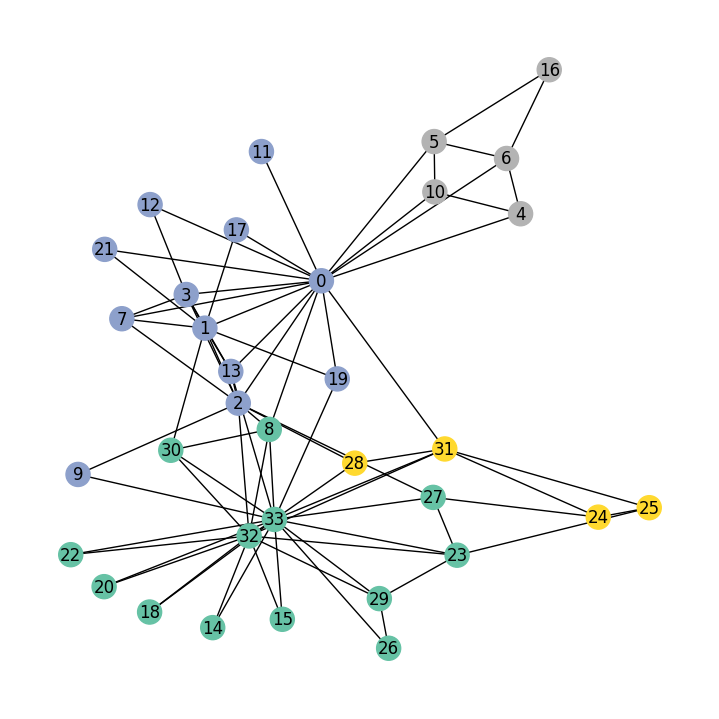

In [13]:
G = to_networkx(data, to_undirected=True) # convert a graph data structure from a library like PyTorch Geometric to a NetworkX graph
visualizeGraph(G, color = data.y)

In [14]:
data.y

tensor([1, 1, 1, 1, 3, 3, 3, 1, 0, 1, 3, 1, 1, 1, 0, 0, 3, 1, 0, 1, 0, 1, 0, 0,
        2, 2, 0, 0, 2, 0, 0, 2, 0, 0])

# Implementing Graph Neural Networks

In [15]:
from torch.nn import Linear
from torch_geometric.nn import GCNConv

In [16]:
class GCN(torch.nn.Module):
  def __init__(self):
    super(GCN, self).__init__()
    torch.manual_seed(1234)
    self.conv1 = GCNConv(dataset.num_features, 4)
    self.conv2 = GCNConv(4, 4)
    self.conv3 = GCNConv(4, 2)
    self.classifier = Linear(2, dataset.num_classes)

  def forward(self, x, edge_index):
    h = self.conv1(x, edge_index)
    h = h.tanh()
    h = self.conv2(h, edge_index)
    h = h.tanh()
    h = self.conv3(h, edge_index)
    h = h.tanh() #  Final GNN embedding space

    # Used Linear Classifier
    output = self.classifier(h)

    return output, h




In [17]:
dataset.num_classes

4

In [18]:
model = GCN()
print(model)

GCN(
  (conv1): GCNConv(34, 4)
  (conv2): GCNConv(4, 4)
  (conv3): GCNConv(4, 2)
  (classifier): Linear(in_features=2, out_features=4, bias=True)
)


# **Embedding the karate club network**

In [19]:
_, h = model(data.x, data.edge_index)
print("Embedding Shape: ", list(h.shape))

Embedding Shape:  [34, 2]


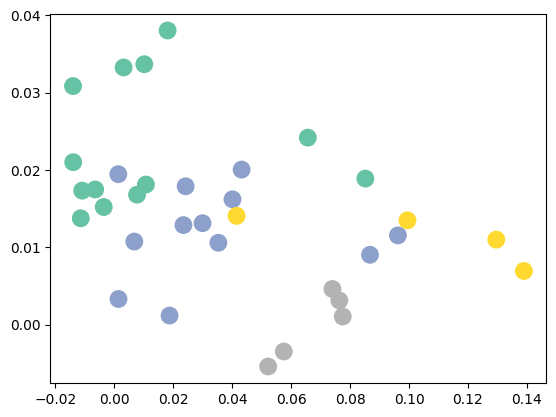

In [20]:
VisualizeEmbedding(h, color = data.y)

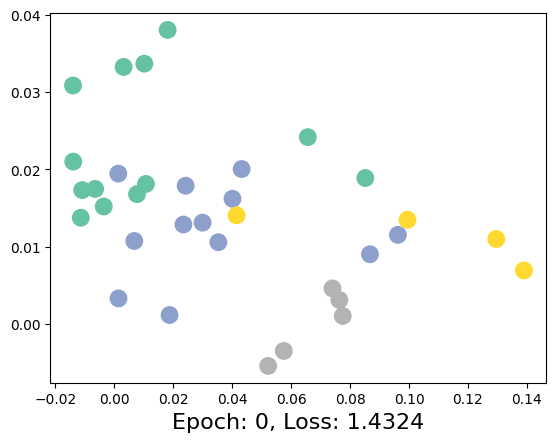

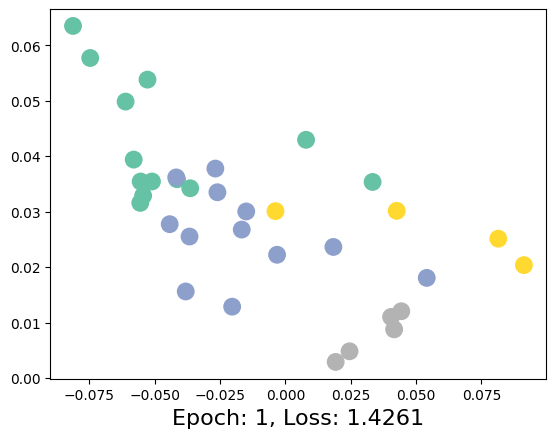

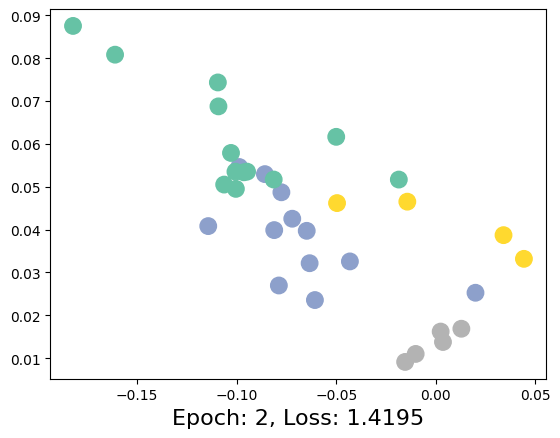

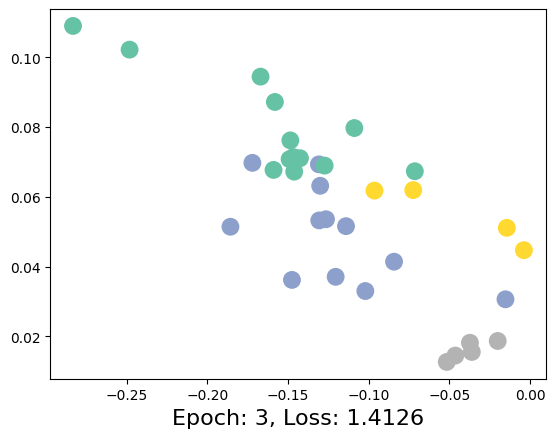

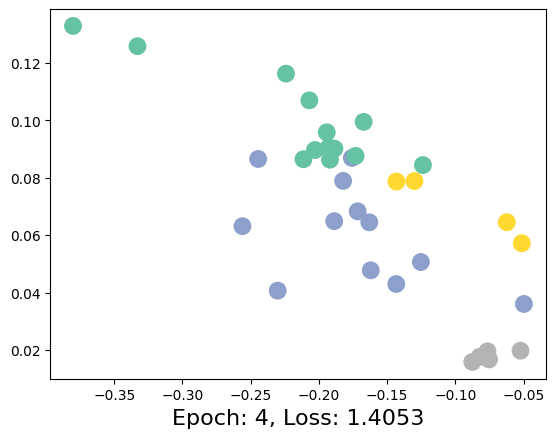

...

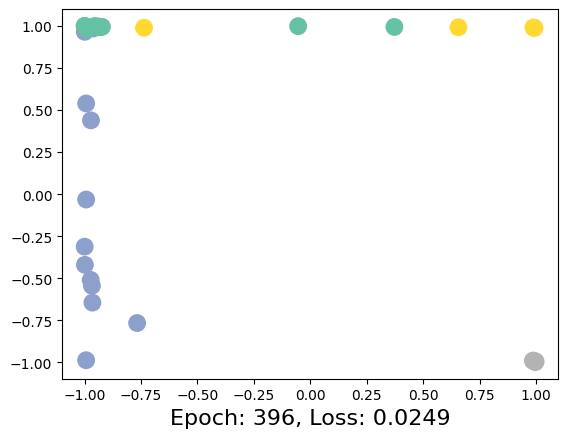

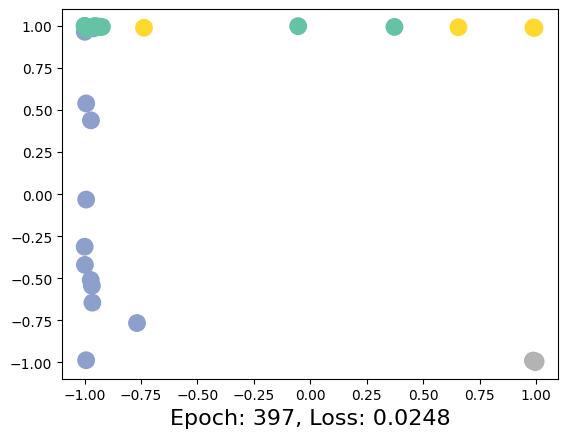

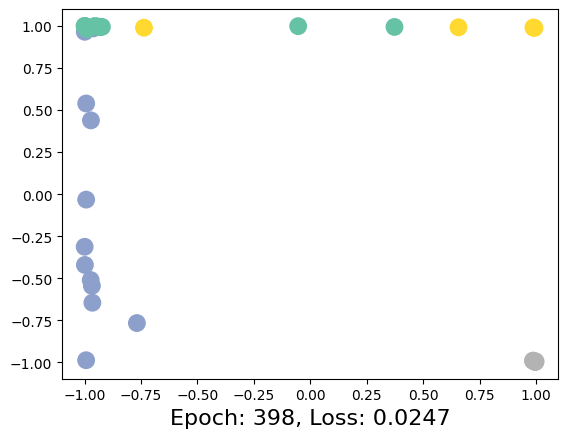

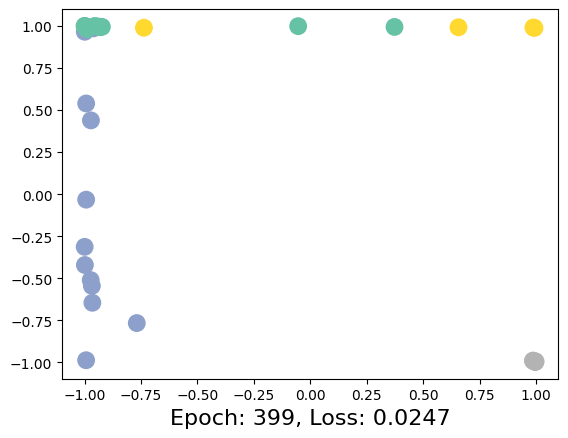

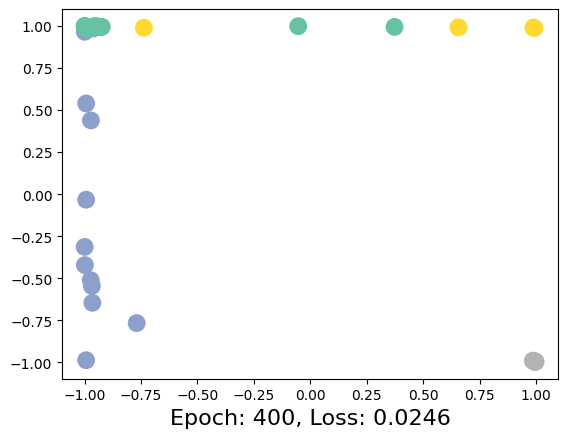

In [21]:
# Training
criterion = torch.nn.CrossEntropyLoss()  # Define loss criterion.
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)  # Define optimizer.

def train(data):
  optimizer.zero_grad()  # Clear gradients.
  output, h = model(data.x, data.edge_index)  # Perform a single forward pass.
  loss = criterion(output[data.train_mask], data.y[data.train_mask])  # Compute the loss solely based on the training nodes.
  loss.backward()  # Derive gradients.
  optimizer.step()  # Update parameters based on gradients.
  return loss, h

for epoch in range(401):
  loss, h = train(data)
  VisualizeEmbedding(h, color = data.y, epoch = epoch, loss = loss)


[https://colab.research.google.com/drive/1h3-vJGRVloF5zStxL5I0rSy4ZUPNsjy8?usp=sharing](https://colab.research.google.com/drive/1h3-vJGRVloF5zStxL5I0rSy4ZUPNsjy8?usp=sharing)